![](https://raw.githubusercontent.com/cengineer13/modern_computer_vision/main/LOGO.png)
# **Background and Foreground Subtraction**

####**In this lesson we'll learn:**
1. Background Subtraction with Gaussian Mixture-based Background/Foreground Segmentation Algorithm
2. Improved adaptive Gausian mixture model for background subtraction

<p>
    <p>

**Taken fron the OpenCV Docs**



Background subtraction (BS) is a common and widely used technique for generating a foreground mask (namely, a binary image containing the pixels belonging to moving objects in the scene) by using static cameras.

As the name suggests, BS calculates the foreground mask performing a subtraction between the current frame and a background model, containing the static part of the scene or, more in general, everything that can be considered as background given the characteristics of the observed scene.

![](https://docs.opencv.org/3.4/Background_Subtraction_Tutorial_Scheme.png)

Background modeling consists of two main steps:

1. Background Initialization;
2. Background Update.

In the first step, an initial model of the background is computed, while in the second step that model is updated in order to adapt to possible changes in the scene.

### Uzbekcha
Fonni ayirish (BS) statik kameralar yordamida oldingi fon niqobini (masalan, sahnadagi harakatlanuvchi ob'ektlarga tegishli piksellarni o'z ichiga olgan ikkilik tasvir) yaratish uchun keng tarqalgan va keng qo'llaniladigan usuldir.

Nomidan ko'rinib turibdiki, BS sahnaning statik qismini yoki umuman olganda, kuzatilayotgan sahnaning xususiyatlarini hisobga olgan holda fon sifatida ko'rib chiqilishi mumkin bo'lgan barcha narsalarni o'z ichiga olgan joriy ramka va fon modeli o'rtasida ayirishni amalga oshiruvchi oldingi fon niqobini hisoblab chiqadi.

Fonni modellashtirish ikki asosiy bosqichdan iborat:

1. Fonni ishga tushirish;
2. Fonni yangilash.

Birinchi bosqichda fonning dastlabki modeli hisoblab chiqiladi, ikkinchi bosqichda esa bu model sahnadagi mumkin bo'lgan o'zgarishlarga moslashish uchun yangilanadi.

# **What is Background Subtraction?**

Background subtraction is a computer vision technique where we seek to isolate the background from the 'moving' foreground. Consider vehciles traversing a roadway, or persons walking along a sidewalk. 

It sounds simple in theory (i.e. just keep the station pixels and remove the ones that were changing). However, things like lighting condition changes, shadows etc. can make things get more complicated. 

Several algorithms were introduced for this purpose. In the following, we will have a look at two algorithms from the **bgsegm** module.


### Uzbekcha
Fonni ayirma - bu kompyuterni ko'rish usuli bo'lib, biz fonni "harakatlanuvchi" oldingi plandan ajratishga harakat qilamiz. Yo'ldan o'tayotgan transport vositalarini yoki piyodalar yo'lakchasi bo'ylab ketayotgan odamlarni ko'rib chiqing.

Nazariy jihatdan oddiy ko'rinadi (ya'ni, faqat stantsiya piksellarini saqlang va o'zgaruvchanlarini olib tashlang). Biroq, yorug'lik holatining o'zgarishi, soyalar va boshqalar kabi narsalarni murakkablashtirishi mumkin.

Shu maqsadda bir nechta algoritmlar kiritilgan. Quyida biz **bgsegm** modulidan ikkita algoritmni ko'rib chiqamiz.

In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Define our imshow function 
def imshow(title = "Image", image = None, size = 10):
    w, h = image.shape[0], image.shape[1]
    aspect_ratio = w/h
    plt.figure(figsize=(size * aspect_ratio,size))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.show()

 # 1-usul.  **Gaussian Mixture-based Background/Foreground Segmentation Algorithm**

In this paper, we propose a background subtraction (BGS) method based on the Gaussian mixture models using color and depth information. For combining color and depth information, we used the probabilistic model based on Gaussian distribution. In particular, we focused on solving color camouflage problem and depth denoising. For evaluating our method, we built a new dataset containing normal, color camouflage and depth camouflage situations. The dataset files consist of color, depth and ground truth image sequences. With these files, we compared the proposed algorithm with the conventional color-based BGS techniques in terms of precision, recall and F-measure. As a result, our method showed the best performance. Thus, this technique will help to robustly detect regions of interest as pre-processing in high-level image processing stages.


Link to Paper - https://www.researchgate.net/publication/283026260_Background_subtraction_based_on_Gaussian_mixture_models_using_color_and_depth_information
 


### Uzbekcha 
Ushbu maqolada biz rang va chuqurlik ma'lumotlaridan foydalangan holda Gauss aralashmasi modellariga asoslangan fonni olib tashlash (BGS) usulini taklif qilamiz. Rang va chuqurlik ma'lumotlarini birlashtirish uchun biz Gauss taqsimotiga asoslangan ehtimollik modelidan foydalandik. Xususan, biz ranglarni kamuflyaj muammosini va chuqurlikni yo'qotish muammosini hal qilishga e'tibor qaratdik. Bizning usulimizni baholash uchun biz oddiy, rangli kamuflyaj va chuqurlikdagi kamuflyaj holatlarini o'z ichiga olgan yangi ma'lumotlar to'plamini yaratdik. Ma'lumotlar to'plami fayllari rang, chuqurlik va asosiy haqiqat tasvirlari ketma-ketliklaridan iborat. Ushbu fayllar yordamida biz taklif qilingan algoritmni an'anaviy rangga asoslangan BGS texnikasi bilan aniqlik, eslab qolish va F o'lchovi nuqtai nazaridan solishtirdik. Natijada, bizning usulimiz eng yaxshi ko'rsatkichni ko'rsatdi. Shunday qilib, ushbu uslub yuqori darajadagi tasvirni qayta ishlash bosqichlarida oldindan ishlov berish sifatida qiziqish hududlarini ishonchli aniqlashga yordam beradi.

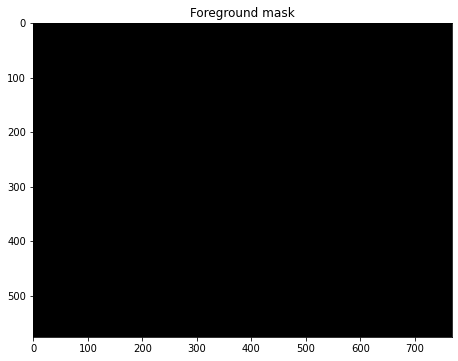

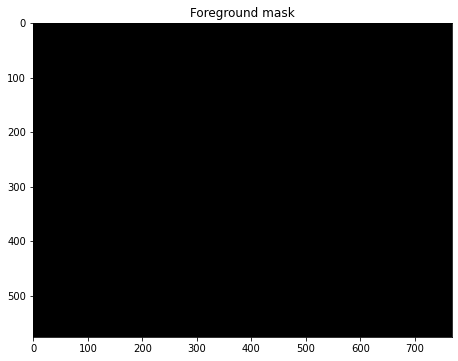

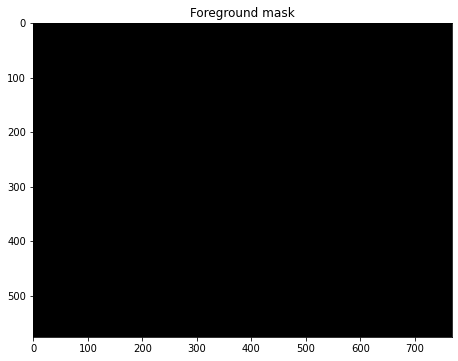

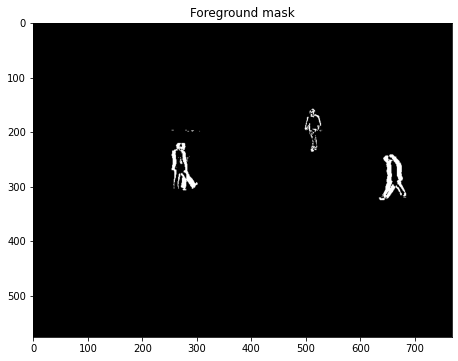

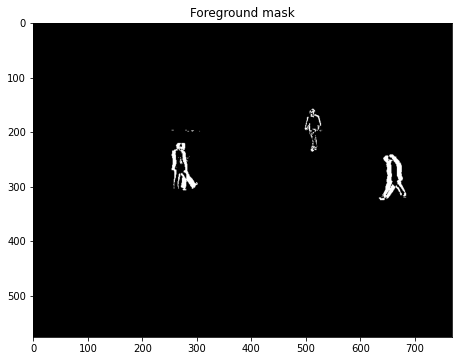

...

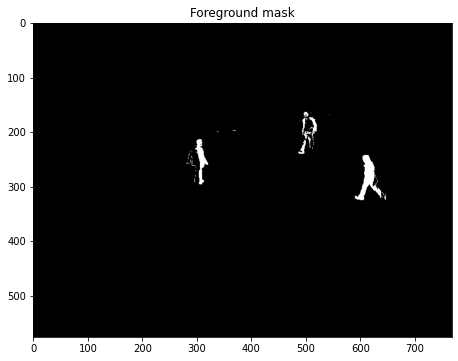

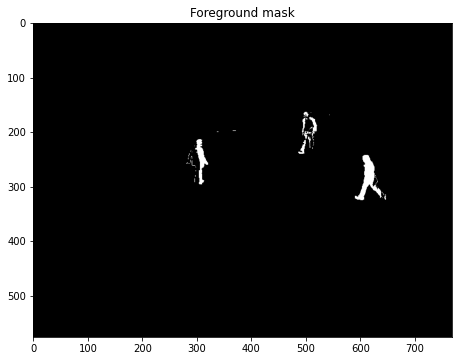

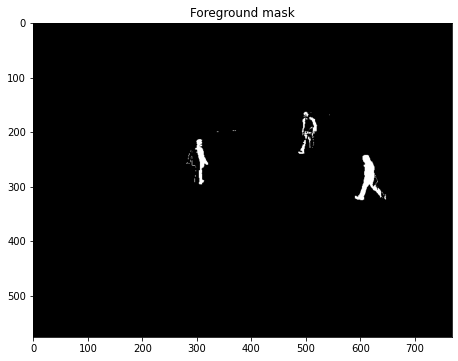

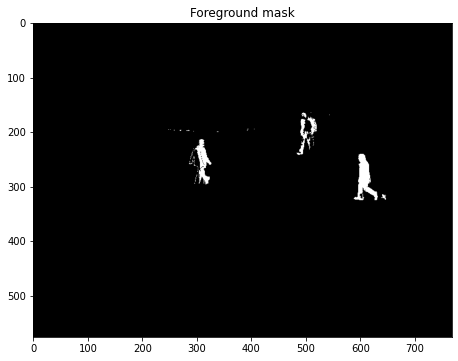

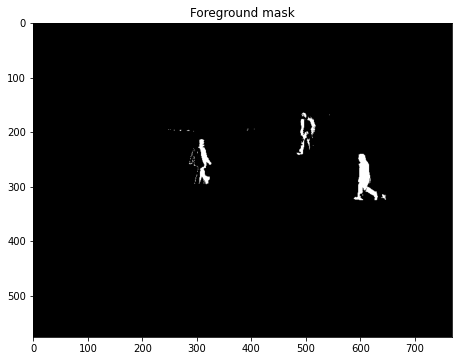

KeyboardInterrupt: 

In [6]:
cap = cv2.VideoCapture('Datasets/videos/walking.mp4')

w = int(cap.get(3)) #3 frame eni olchami
h = int(cap.get(4)) #4 parametr frame boyi olchami 

fourcc = cv2.VideoWriter_fourcc(*'MPV4')
#out = cv2.VideoWriter('Datasets/videos/walking_GaussianM.mp4', fourcc, 30, (w, h))#here 3-frame

#initialize background subtraction 
bsMOG = cv2.bgsegm.createBackgroundSubtractorMOG()

while cap.isOpened(): 
    
    ret, frame = cap.read()
    
    if ret:
        #bse ni apply methodidan foydalanib foreground maskni olamiz. 
        foreground_mask = bsMOG.apply(frame)
        #out.write(foreground_mask) #ajralgan foregroundni yozib ko'ramiz. 
        imshow('Foreground mask', foreground_mask)

        #cv2.imshow('foreground_mask', foreground_mask)
        if cv2.waitKey(1) & 0xFF==ord('q'):
            break
    else:
        break

cap.release()
#out.release()
cv2.destroyAllWindows()

# 2-usul. ** Improved adaptive Gausian mixture model for background subtraction**

Background subtraction is a common computer vision task. We analyze the usual pixel-level approach. We develop an efficient adaptive algorithm using Gaussian mixture probability density. Recursive equations are used to constantly update the parameters and but also to simultaneously select the appropriate number of components for each pixel.

https://www.researchgate.net/publication/4090386_Improved_Adaptive_Gaussian_Mixture_Model_for_Background_Subtraction

Orqa fonni olib tashlash - bu kompyuterni ko'rishning keng tarqalgan vazifasi. Biz odatdagi piksel darajasidagi yondashuvni tahlil qilamiz. Biz Gauss aralashmasi ehtimoli zichligidan foydalangan holda samarali adaptiv algoritmni ishlab chiqamiz. Rekursiv tenglamalar parametrlarni doimiy ravishda yangilash uchun, shuningdek, bir vaqtning o'zida har bir piksel uchun mos keladigan komponentlar sonini tanlash uchun ishlatiladi.


Frames per second :  30 FPS
Frame count :  461.0


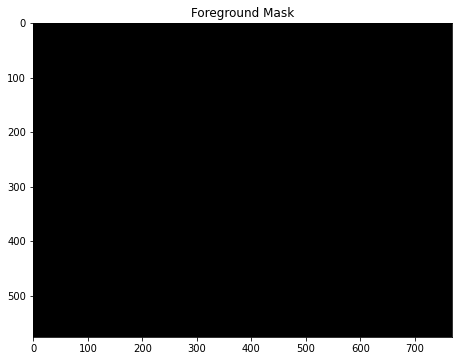

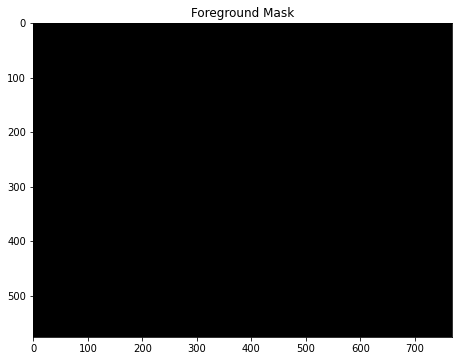

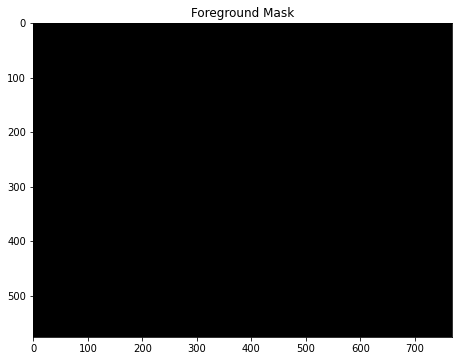

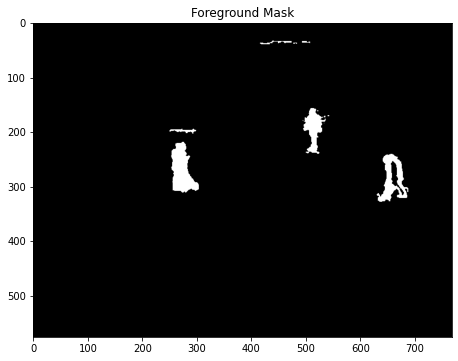

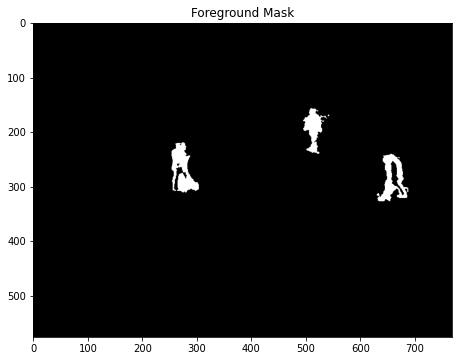

...

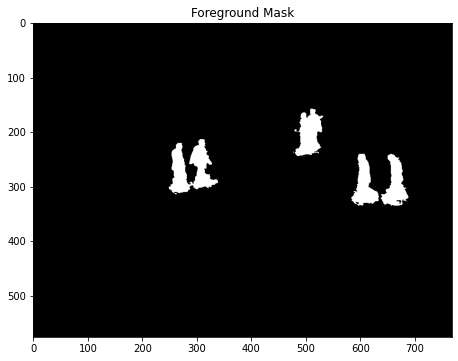

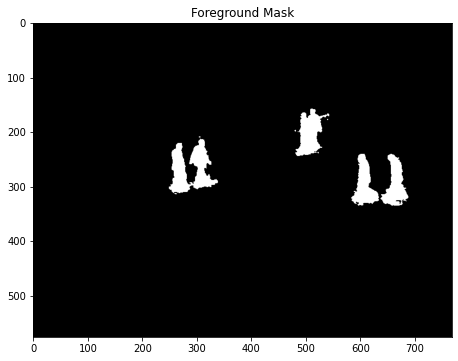

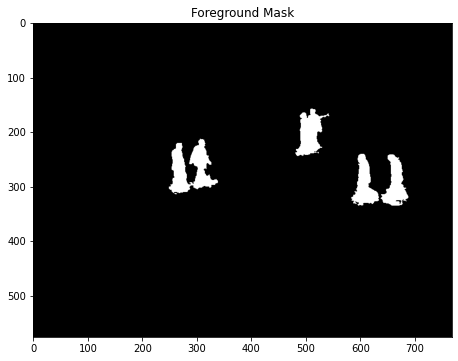

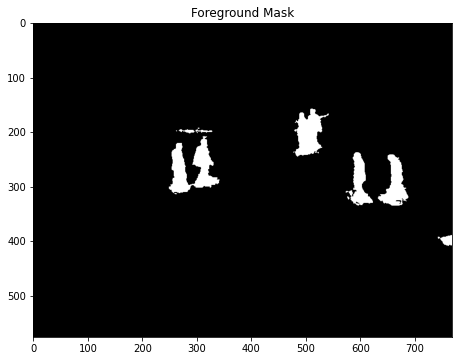

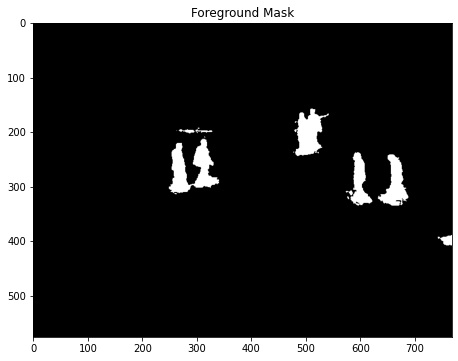

KeyboardInterrupt: 

In [2]:
cap = cv2.VideoCapture('Datasets/videos/walking.mp4')

w = int(cap.get(3)) #3 frame eni olchami
h = int(cap.get(4)) #4 parametr frame boyi olchami 
fps = int(cap.get(5)) #5 parametr fps 
print('Frames per second : ', fps,'FPS')
frame_count = cap.get(7)
print('Frame count : ', frame_count)

fourcc = cv2.VideoWriter_fourcc(*'MPV4')
out = cv2.VideoWriter('Datasets/videos/walking_AdaptiveGM.mp4', fourcc, 30, (w, h))

# Initlaize background subtractor
bsGSOC = cv2.bgsegm.createBackgroundSubtractorGSOC()

# Loop once video is successfully loaded
while True:
    ret, frame = cap.read()
    if ret: 
        #bs ni apply methodidan foydalanib foreground maskni olamiz. 
        foreground_mask = bsGSOC.apply(frame)
        #out.write(foreground_mask)
        #imshow("Foreground Mask", foreground_mask)
        
        cv2.imshow('foreground_mask', foreground_mask)
        if cv2.waitKey(1) & 0xFF==ord('q'):
            break
    else:
        break

        
cap.release()
out.release()
cv2.destroyAllWindows()

## Bitwise yordamida foregroundni yaxshiroq korish

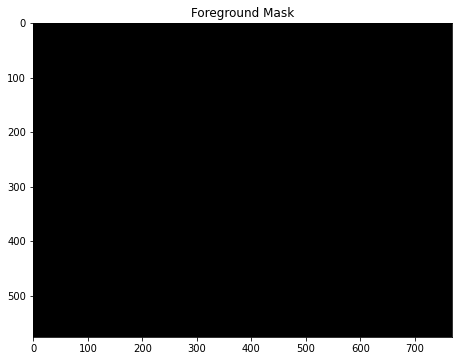

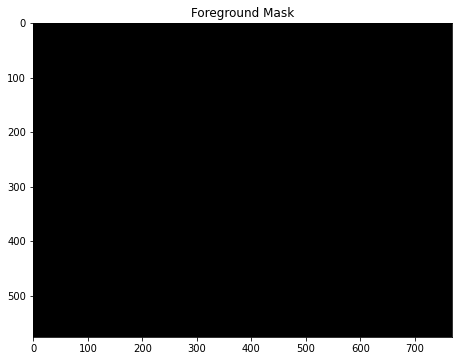

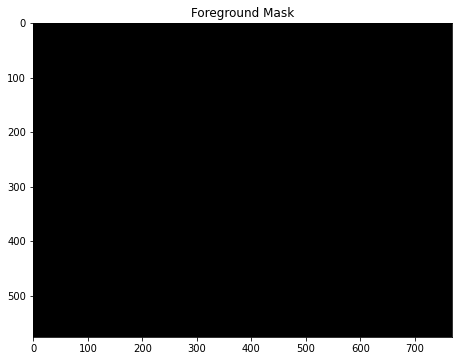

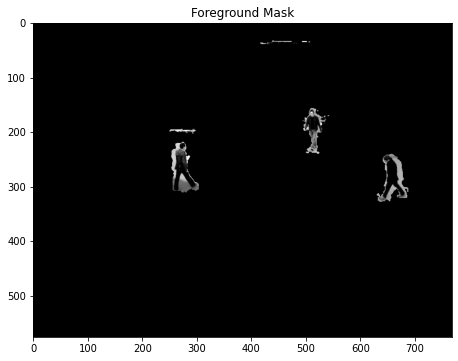

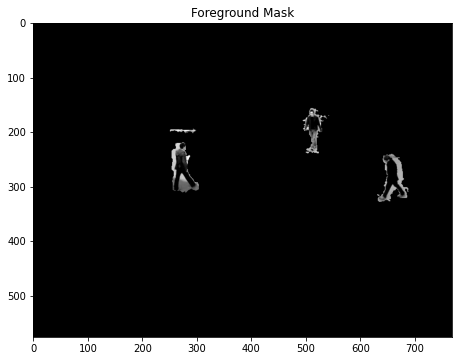

...

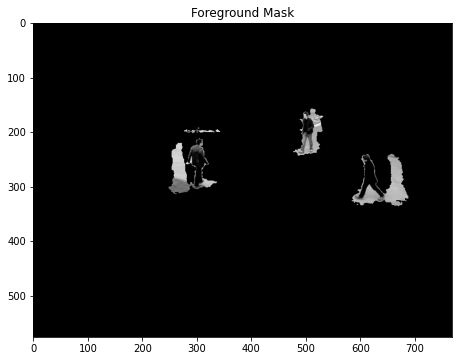

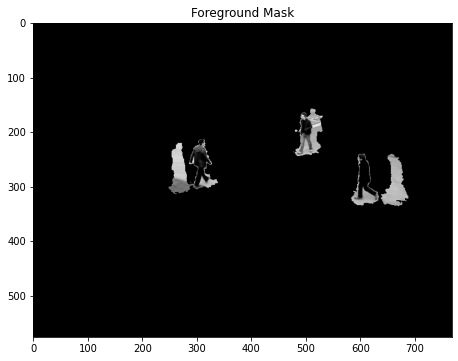

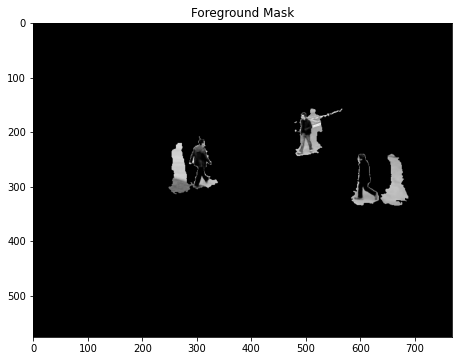

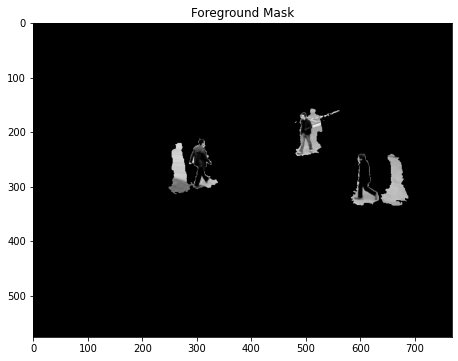

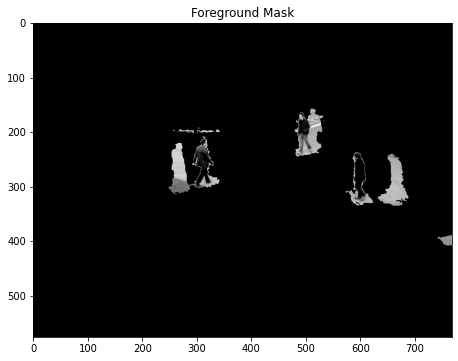

KeyboardInterrupt: 

In [3]:
cap = cv2.VideoCapture('Datasets/videos/walking.mp4')


# Initlaize background subtractor
bsGSOC = cv2.bgsegm.createBackgroundSubtractorGSOC()

# Loop once video is successfully loaded
while True:
    ret, frame = cap.read()
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    if ret: 
        #bs ni apply methodidan foydalanib foreground maskni olamiz. 
        foreground_mask = bsGSOC.apply(frame)
        res = cv2.bitwise_and(gray, foreground_mask) 
        
        imshow("Foreground Mask", res)
        
    else:
        break

        
cap.release()
cv2.destroyAllWindows()

# 3-usul. **Background Substraction KKN**

The parameters if you wish to veer away from the default settings:

- **history** is the number of frames used to build the statistic model of the background. The smaller the value is, the faster changes in the background will be taken into account by the model and thus be considered as background. And vice versa.
- **dist2Threshold** is a threshold to define whether a pixel is different from the background or not. The smaller the value is, the more sensitive movement detection is. And vice versa.
- **detectShadows** : If set to true, shadows will be displayed in gray on the generated mask. (Example bellow)

https://docs.opencv.org/master/de/de1/group__video__motion.html#gac9be925771f805b6fdb614ec2292006d

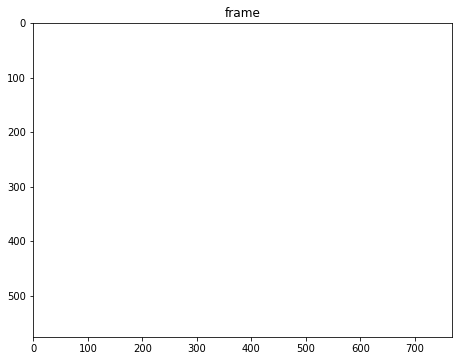

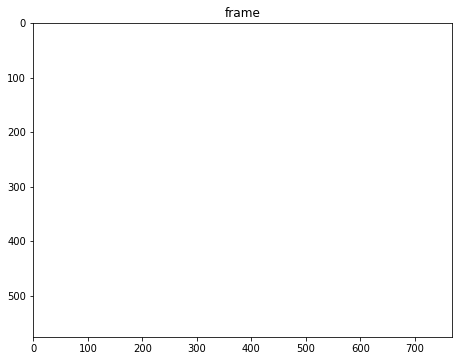

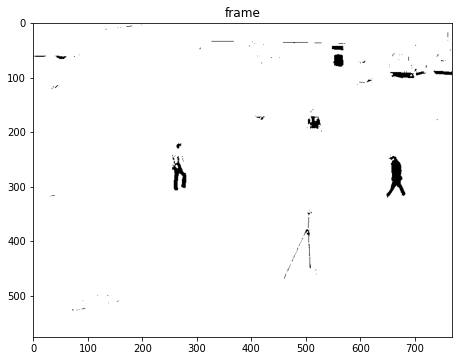

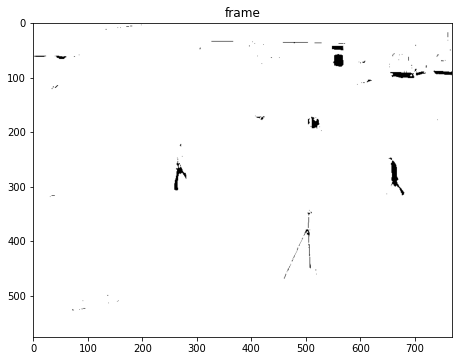

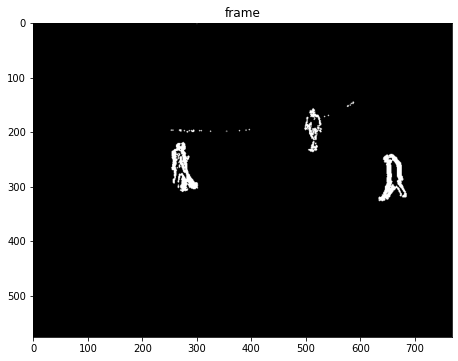

...

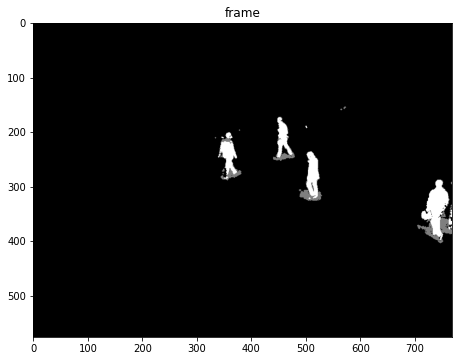

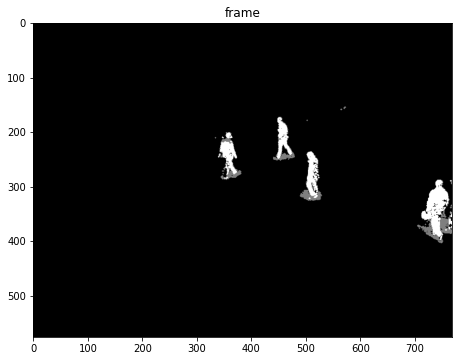

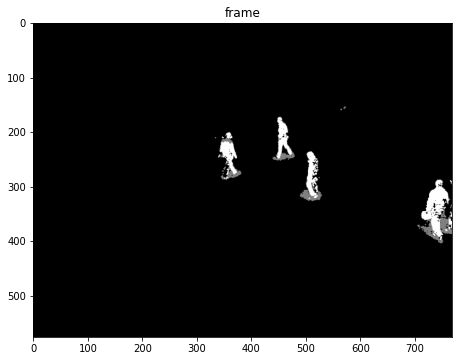

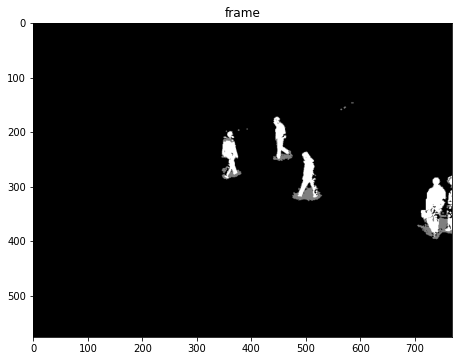

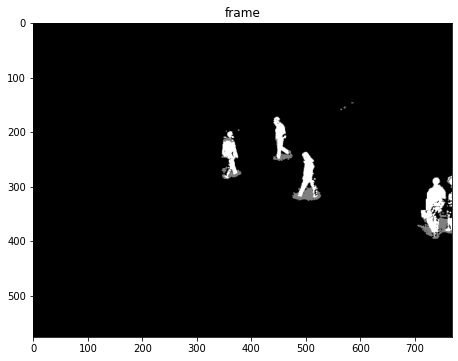

KeyboardInterrupt: 

In [2]:
cap = cv2.VideoCapture('Datasets/videos/walking.mp4')

# Get the height and width of the frame (required to be an interfer)
w = int(cap.get(3))
h = int(cap.get(4))

# Define the codec and create VideoWriter object.The output is stored in 'outpy.avi' file.
out = cv2.VideoWriter('Datasets/videos/output/walking_Bsubtraction_KNN.mp4', cv2.VideoWriter_fourcc(*'MPV4'), 30, (w, h))

kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(3,3))
bsKNN = cv2.createBackgroundSubtractorKNN()

while(1):
    ret, frame = cap.read()

    if ret:
        fgmask = bsKNN.apply(frame)
        fgmask = cv2.morphologyEx(fgmask, cv2.MORPH_OPEN, kernel) #denoising qilish uchun qollandi

        imshow('frame', fgmask)
#         cv2.imshow('Background substruction KNN', fgmask)
        
#         if cv2.waitKey(1) & 0xFF==ord('q'):
#             break
    
    else:
        break

cap.release()
out.release()

## **Foreground Subtraction** 

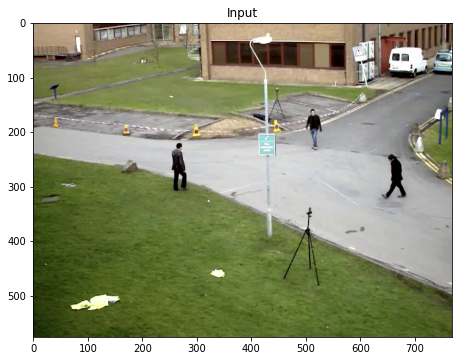

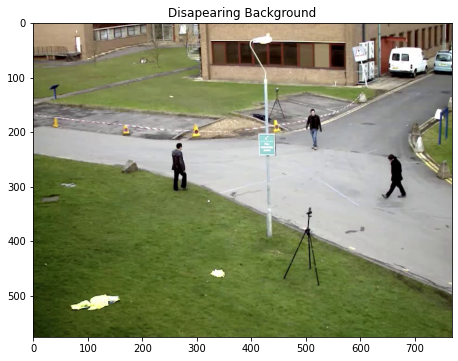

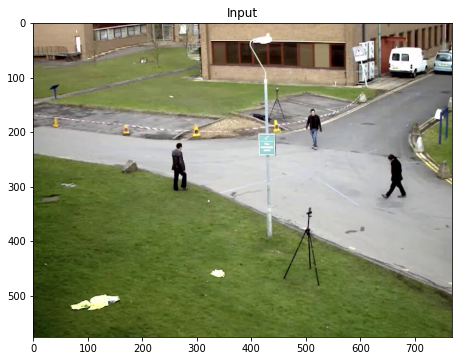

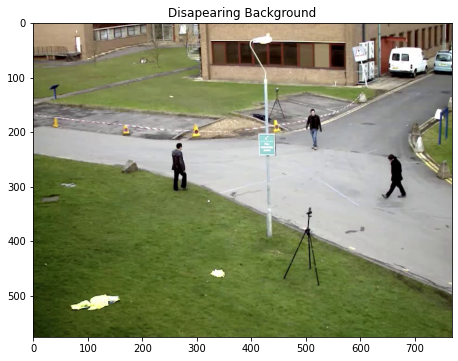

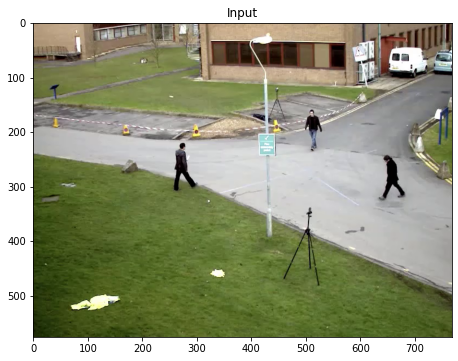

...

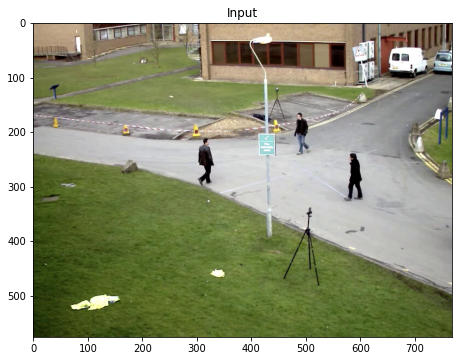

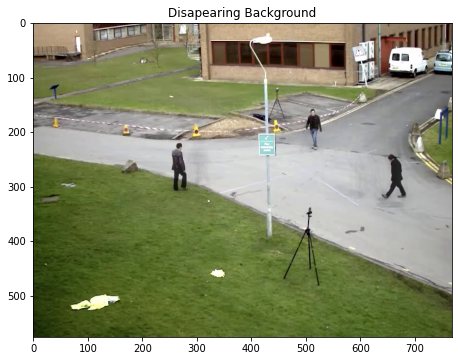

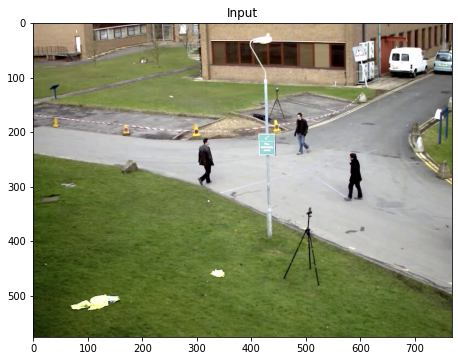

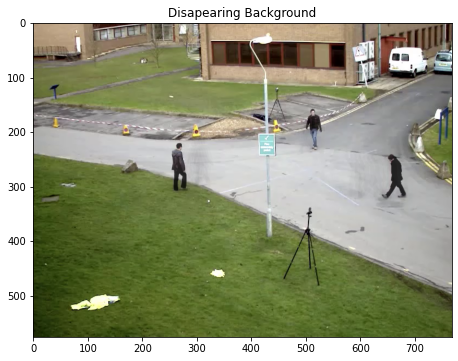

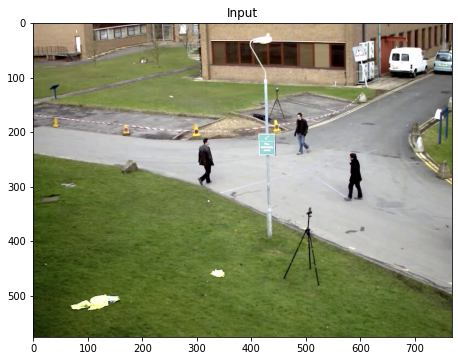

KeyboardInterrupt: 

<Figure size 540x720 with 0 Axes>

In [15]:
cap = cv2.VideoCapture('Datasets/videos/walking.mp4')

# Get the height and width of the frame (required to be an interfer)
w = int(cap.get(3))
h = int(cap.get(4))

# Define the codec and create VideoWriter object.The output is stored in 'outpy.avi' file.
out = cv2.VideoWriter('Datasets/videos/output/walking_foreground.mp4', cv2.VideoWriter_fourcc(*'MPV4'), 30, (w, h))
ret, frame = cap.read()

# Create a flaot numpy array with frame values
average = np.float32(frame)

while True:

    ret, frame = cap.read()

    if ret: 
      
        # 0.01 is the weight of image, play around to see how it changes
        cv2.accumulateWeighted(frame, average, 0.01)

        # Scales, calculates absolute values, and converts the result to 8-bit
        background = cv2.convertScaleAbs(average)

        imshow('Input', frame)
        imshow('Disapearing Background', background)
        out.write(background)
#         cv2.imshow("original", frame)
#         cv2.imshow('Disapearing Background', background)
#         if cv2.waitKey(1) & 0xFF==ord('q'):
#             break
        

    else:
          break

cap.release()
out.release()
cv2.destroyAllWindows()